Importy

In [1]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import joblib
import glob
import itertools
import copy
import os

Wspólne funkcje i klasy sieci

In [2]:
class SubNetwork(nn.Module):
    def __init__(self, input_dim, output_dim=1):
        super(SubNetwork, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 256), nn.ReLU(),
            nn.Linear(256, 256), nn.ReLU(),
            nn.Linear(256, output_dim)
        )
    def forward(self, x): return self.net(x)

def train_greybox_model(model, dataloader, epochs=2000, patience=50, min_delta=1e-6):
    optimizer = optim.Adam(model.parameters(), lr=5e-4)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.97)
    criterion = nn.MSELoss()
    
    # --- Zmienne dla Early Stopping ---
    best_loss = float('inf') # Ustawiamy początkowy "najlepszy" błąd na nieskończoność
    patience_counter = 0     # Licznik epok bez poprawy
    best_model_weights = copy.deepcopy(model.state_dict()) # Tu będziemy trzymać kopię najlepszych wag
    
    model.train()
    print(f"Rozpoczynam trening (Maksymalnie {epochs} epok, Cierpliwość: {patience})...")
    
    for epoch in range(epochs):
        epoch_loss = 0.0
        
        # Przejście przez wszystkie paczki danych
        for u_seq, y_true_seq in dataloader:
            x_init = torch.zeros(u_seq.size(0), model.num_states)
            optimizer.zero_grad()
            y_pred_seq = model(u_seq, x_init)
            loss = criterion(y_pred_seq.view_as(y_true_seq), y_true_seq)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()
            
        scheduler.step()
        avg_loss = epoch_loss / len(dataloader)
        
        # Wypisywanie postępu
        if (epoch + 1) % 10 == 0:
            print(f"Epoka {epoch+1}/{epochs} | Strata MSE: {avg_loss:.6f}")
            
        # --- LOGIKA EARLY STOPPING ---
        # Sprawdzamy, czy obecna strata jest zauważalnie lepsza od najlepszej dotychczasowej
        if best_loss - avg_loss > min_delta:
            best_loss = avg_loss               # Zapisujemy nowy rekord
            patience_counter = 0               # Zerujemy licznik cierpliwości
            best_model_weights = copy.deepcopy(model.state_dict()) # Kopiujemy i zapisujemy te najlepsze wagi!
        else:
            patience_counter += 1              # Brak poprawy, zwiększamy licznik
            
        # Jeśli straciliśmy cierpliwość (licznik przekroczył limit)
        if patience_counter >= patience:
            print(f"\n[!] EARLY STOPPING: Przerwano trening w epoce {epoch+1}!")
            print(f"Brak poprawy o minimum {min_delta} od {patience} epok.")
            break # Wychodzimy z głównej pętli treningowej
            
    # Po zakończeniu pętli (niezależnie czy doszła do 2000, czy ucięło ją wcześnie)
    # wgrywamy z powrotem NAJLEPSZE wagi, żeby nie zwracać modelu z ostatniej, gorszej epoki.
    model.load_state_dict(best_model_weights)
    print(f"Trening zakończony. Załadowano najlepsze wagi ze stratą MSE: {best_loss:.6f}\n")
    
    return model

def create_sequences(inputs, targets, seq_len=600):
    xs, ys = [], []
    for i in range(0, len(inputs) - seq_len + 1, seq_len):
        xs.append(inputs[i : i + seq_len])
        ys.append(targets[i : i + seq_len])
    return np.array(xs), np.array(ys)

# NOWOŚĆ: Uniwersalna funkcja do rysowania walidacji Open-Loop!
# ==========================================
# ULEPSZONA FUNKCJA WALIDACJI Z FILTREM REZIDUUM
# ==========================================
def validate_and_plot(model, scaler_u, scaler_y, input_cols, target_cols, file_path, title_prefix, alpha=0.05, threshold=None):
    # Wczytanie i przygotowanie danych
    df_test = pd.read_csv(file_path)
    X_test_tensor = torch.tensor(scaler_u.transform(df_test[input_cols].values), dtype=torch.float32).unsqueeze(0)
    Y_test_tensor = torch.tensor(scaler_y.transform(df_test[target_cols].values), dtype=torch.float32).unsqueeze(0)
    
    # Przewidywanie modelu
    model.eval()
    with torch.no_grad():
        y_pred = model(X_test_tensor, torch.zeros(1, model.num_states))
        
    y_pred_real = scaler_y.inverse_transform(y_pred[0].cpu().numpy().reshape(-1, 1))
    y_true_real = scaler_y.inverse_transform(Y_test_tensor[0].cpu().numpy().reshape(-1, 1))
    czas = np.arange(len(y_true_real)) * 0.05
    
    # ---------------------------------------------------------
    # OBLICZANIE I FILTROWANIE REZIDUUM (BŁĘDU BEZWZGLĘDNEGO)
    # ---------------------------------------------------------
    e_raw = np.abs(y_true_real - y_pred_real) #/ (np.abs(y_pred_real) + 1e-5) # 1e-5 dla bezpieczeństwa
    e_raw = e_raw #* 100 # Surowy błąd
    e_filtered = np.zeros_like(e_raw)         # Pusta tablica na przefiltrowany błąd
    e_filtered[0] = e_raw[0]                  # Stan początkowy
    
    
    # Pętla filtru EMA (Exponential Moving Average - Filtr dolnoprzepustowy I rzędu)
    for i in range(1, len(e_raw)):
        e_filtered[i] = alpha * e_raw[i] + (1 - alpha) * e_filtered[i-1]
    
    # ---------------------------------------------------------
    # RYSOWANIE WYKRESÓW
    # ---------------------------------------------------------
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 8), sharex=True)
    
    # Górny wykres: Fizyka
    ax1.plot(czas, y_true_real, label='Prawda (Czujnik)', color='black', alpha=0.7)
    ax1.plot(czas, y_pred_real, label='Symulacja (AI)', color='red', linestyle='--', alpha=0.9)
    ax1.set_title(f'{title_prefix} | Plik: {file_path.split("/")[-1]}', fontsize=12)
    ax1.set_ylabel('Wartość fizyczna (np. Pa)')
    ax1.legend(loc='upper right')
    ax1.grid(True, linestyle=':', alpha=0.7)
    
    # Dolny wykres: Diagnostyka
    ax2.plot(czas, e_raw, label='Surowe Reziduum (Szum)', color='gray', alpha=0.4)
    ax2.plot(czas, e_filtered, label=f'Przefiltrowane Reziduum (alpha={alpha})', color='darkred', linewidth=2)
    
    # Jeśli podałeś próg alarmowy, narysuj go
    if threshold is not None:
        ax2.axhline(threshold, color='orange', linestyle='--', linewidth=2, label=f'Próg Detekcji ({threshold})')
        
    ax2.set_title('Sygnał Diagnostyczny (Reziduum)', fontsize=12)
    ax2.set_xlabel('Czas [s]')
    ax2.set_ylabel('Błąd predykcji')
    ax2.legend(loc='upper right')
    ax2.grid(True, linestyle=':', alpha=0.7)
    
    plt.tight_layout()
    plt.show()
    
    print(f"Średni błąd bezwzględny (MAE): {np.mean(e_raw):.4f}")
    print(f"Maksymalny błąd przefiltrowany: {np.max(e_filtered):.4f}")

MSO_1 - pełna dynamika

In [4]:
class GreyBoxSystem_MSO1(nn.Module):
    def __init__(self, T_sample=0.05, num_states=5):
        super(GreyBoxSystem_MSO1, self).__init__()
        # 7 wejść układu
        self.T, self.num_states, self.num_inputs = T_sample, num_states, 7
        total_feat = self.num_states + self.num_inputs
        self.g_func = SubNetwork(total_feat, output_dim=self.num_states)
        self.h_func = SubNetwork(total_feat, output_dim=1)

    def forward(self, u_seq, x_init):
        x_t, preds = x_init, []
        for t in range(u_seq.size(1)):
            inputs = torch.cat((x_t, u_seq[:, t, :]), dim=1)
            preds.append(self.h_func(inputs))
            x_t = x_t + self.T * self.g_func(inputs)
        return torch.stack(preds, dim=1)

u_cols_1 = ['ambient_pressure', 'ambient_temperature', 'intercooler_temperature', 'throttle_position', 'engine_speed', 'injected_fuel_mass', 'wastegate_position']
y_cols_1 = ['intake_manifold_pressure']

# Zakładamy, że masz połączony DataFrame "df_train_nf" ze zdrowymi danymi
DATA_DIR = r"C:\Users\anton\OneDrive\Desktop\data"

HEALTHY_FILES = glob.glob(os.path.join(DATA_DIR, "*_NF*.csv"))
FAULTY_FILES_PIM = glob.glob(os.path.join(DATA_DIR, "*_f_pim*.csv"))
FAULTY_FILES_PIC = glob.glob(os.path.join(DATA_DIR, "*_f_pic*.csv"))
FAULTY_FILES_WAF = glob.glob(os.path.join(DATA_DIR, "*_f_waf*.csv"))
FAULTY_FILES_IML = glob.glob(os.path.join(DATA_DIR, "*_f_iml*.csv"))

healthy_dfs = [pd.read_csv(f) for f in HEALTHY_FILES]
faulty_dfs_pic = [pd.read_csv(f) for f in FAULTY_FILES_PIC]
faulty_dfs_waf = [pd.read_csv(f) for f in FAULTY_FILES_WAF]
faulty_dfs_pim = [pd.read_csv(f) for f in FAULTY_FILES_PIM]
faulty_dfs_iml = [pd.read_csv(f) for f in FAULTY_FILES_IML]


df_train_nf = pd.concat(healthy_dfs + faulty_dfs_pic + faulty_dfs_waf, ignore_index=True)

scaler_u1, scaler_y1 = MinMaxScaler(), MinMaxScaler()
u1_norm = scaler_u1.fit_transform(df_train_nf[u_cols_1].values)
y1_norm = scaler_y1.fit_transform(df_train_nf[y_cols_1].values)

X_seq1, Y_seq1 = create_sequences(u1_norm, y1_norm)
loader1 = DataLoader(TensorDataset(torch.tensor(X_seq1, dtype=torch.float32), torch.tensor(Y_seq1, dtype=torch.float32)), batch_size=16, shuffle=True)

# TRENOWANIE Z NUM_STATES=3
#model1 = GreyBoxSystem_MSO1(num_states=5)
#model1 = train_greybox_model(model1, loader1, epochs=2000)

# NOWE NAZWY WAG
#torch.save(model1.state_dict(), 'szara_skrzynka_mso1_wagi.pth')
#joblib.dump(scaler_u1, 'scaler_u_mso1.pkl')
#joblib.dump(scaler_y1, 'scaler_y_mso1.pkl')

print("MSO 1 (3-stanowe) gotowe i zapisane!")

MSO 1 (3-stanowe) gotowe i zapisane!


Model MSO 1 i skalery zostały pomyślnie wczytane z dysku!


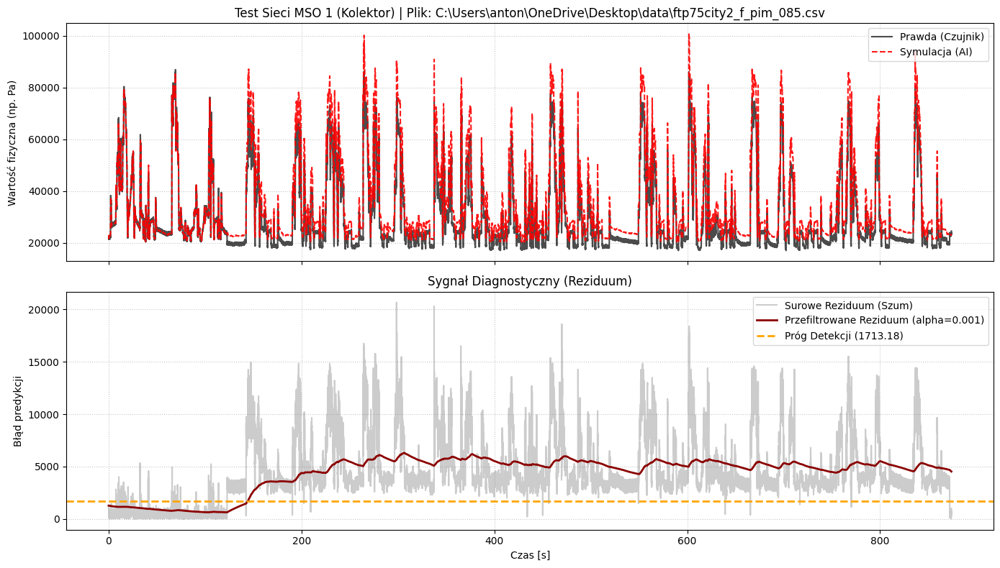

Średni błąd bezwzględny (MAE): 4593.8359
Maksymalny błąd przefiltrowany: 6296.3247


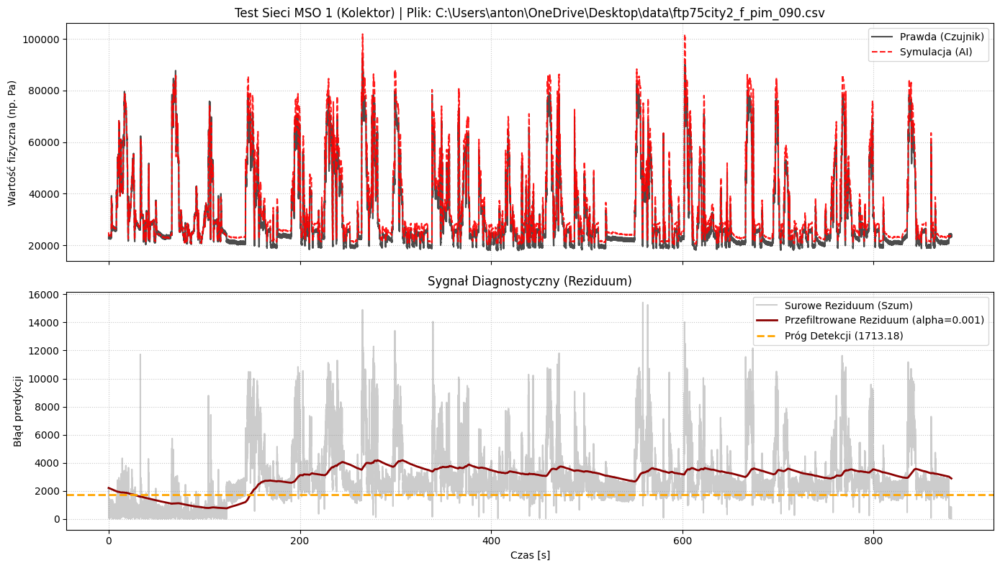

Średni błąd bezwzględny (MAE): 3025.1438
Maksymalny błąd przefiltrowany: 4180.5625


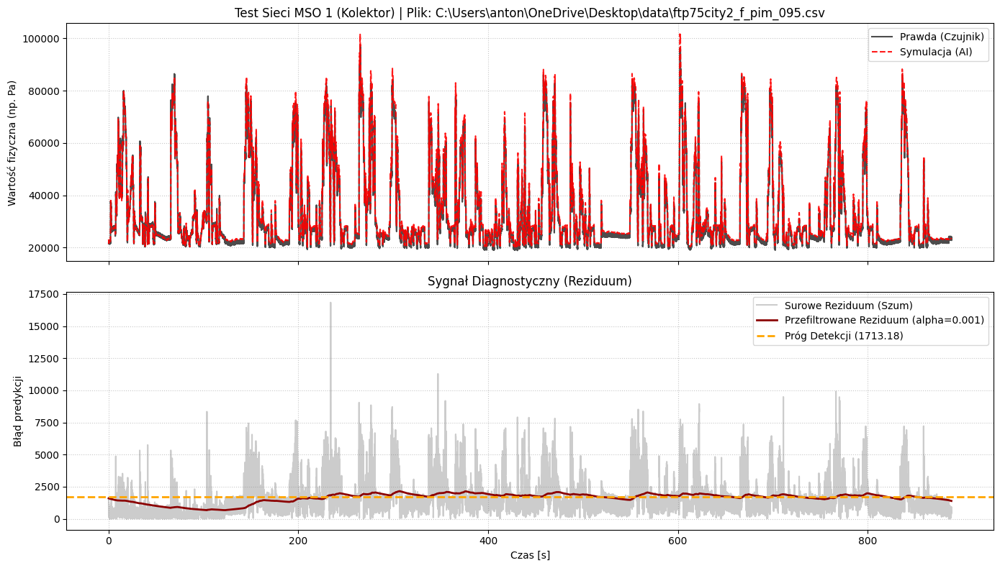

Średni błąd bezwzględny (MAE): 1633.1708
Maksymalny błąd przefiltrowany: 2160.8191


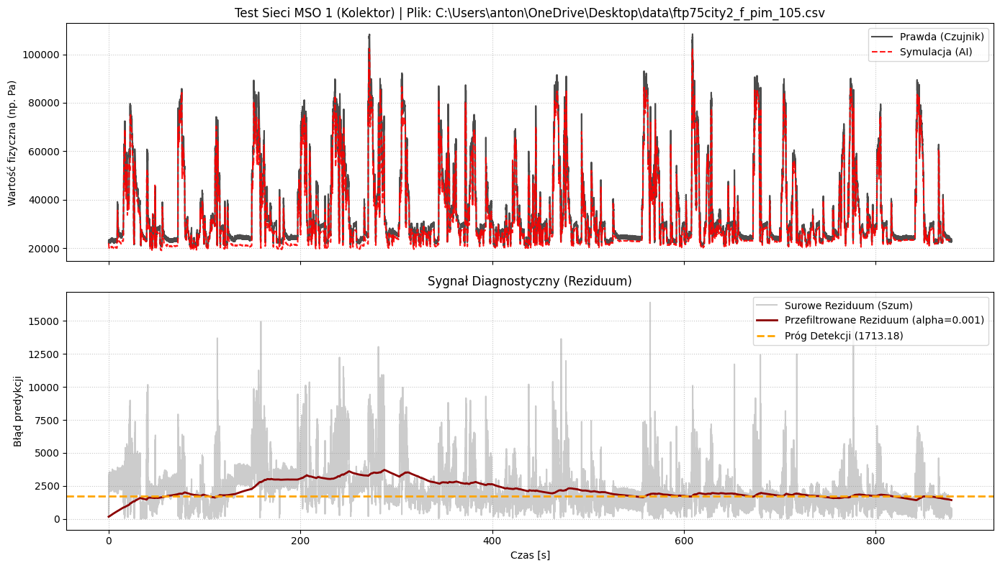

Średni błąd bezwzględny (MAE): 2238.1785
Maksymalny błąd przefiltrowany: 3718.0510


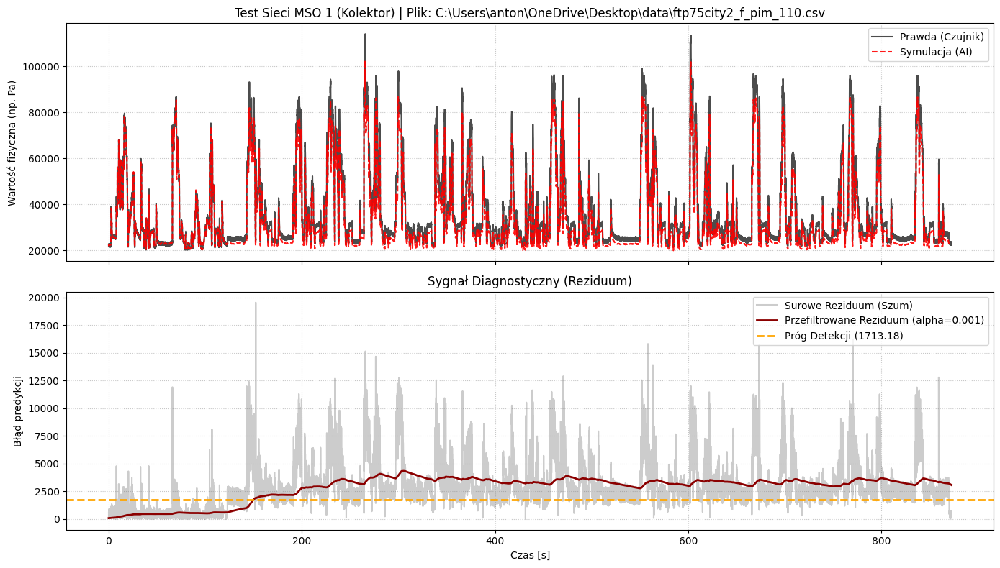

Średni błąd bezwzględny (MAE): 3004.5688
Maksymalny błąd przefiltrowany: 4335.6987


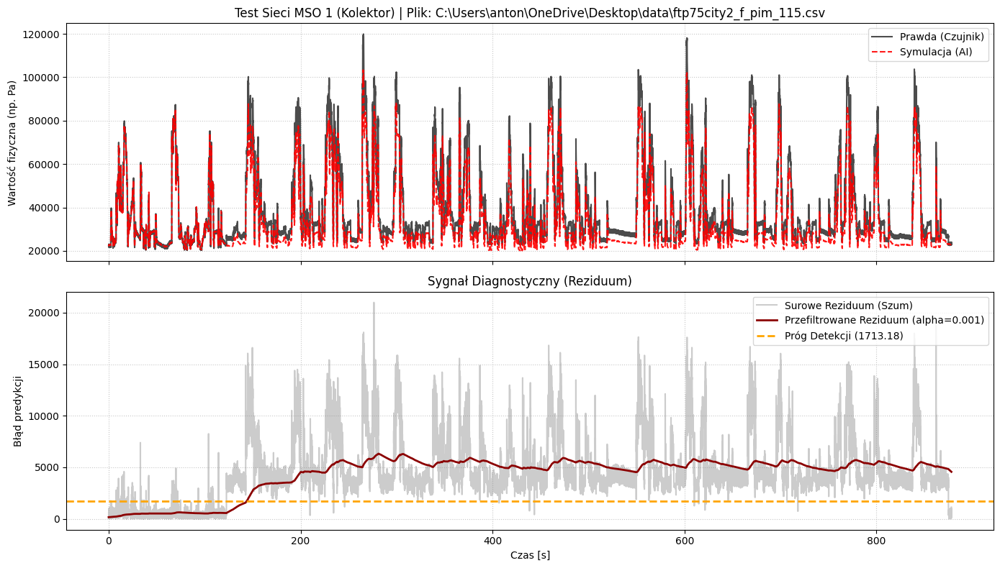

Średni błąd bezwzględny (MAE): 4640.4600
Maksymalny błąd przefiltrowany: 6323.4189


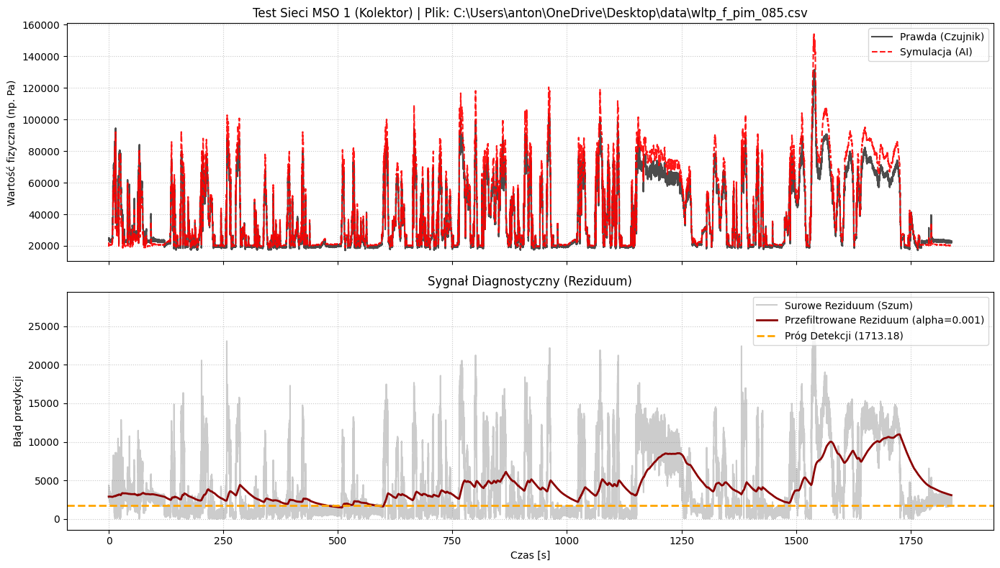

Średni błąd bezwzględny (MAE): 4314.1973
Maksymalny błąd przefiltrowany: 10976.7881


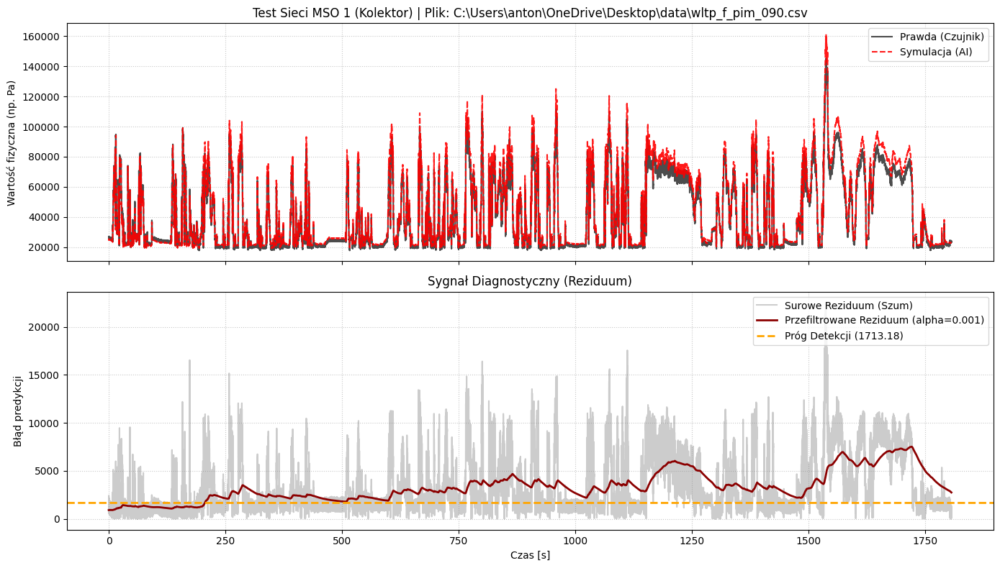

Średni błąd bezwzględny (MAE): 3408.2375
Maksymalny błąd przefiltrowany: 7517.3149


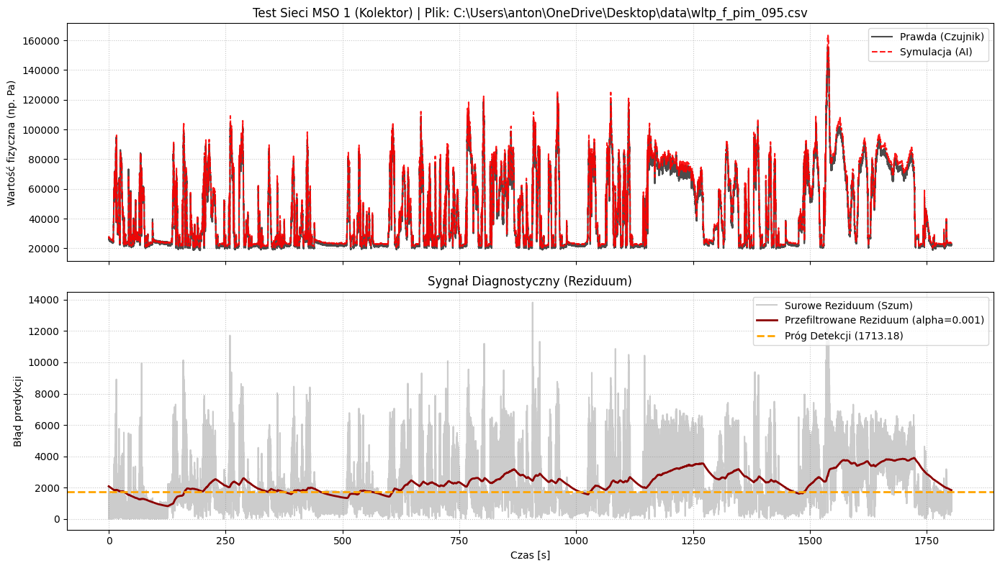

Średni błąd bezwzględny (MAE): 2325.3037
Maksymalny błąd przefiltrowany: 3897.3257


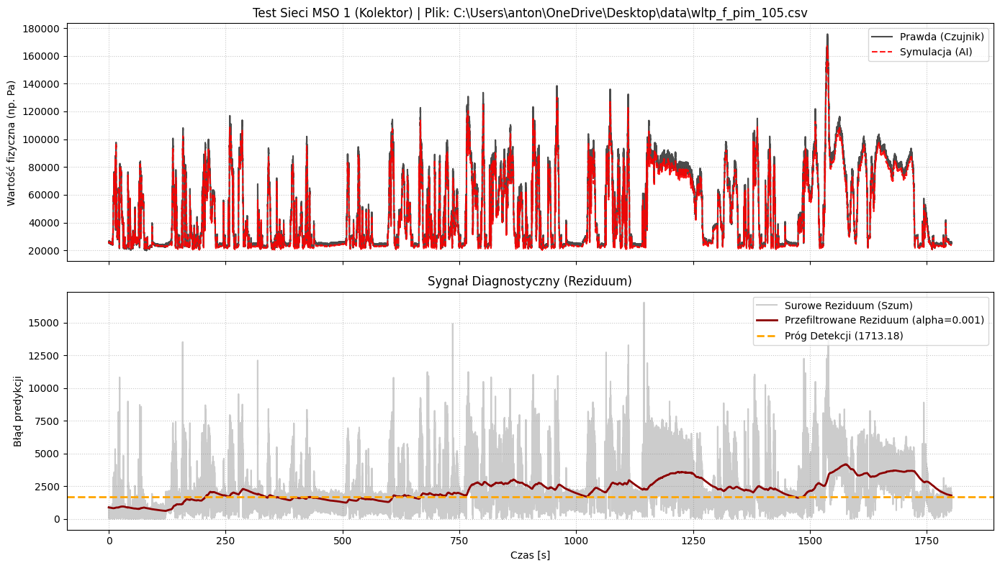

Średni błąd bezwzględny (MAE): 2220.7920
Maksymalny błąd przefiltrowany: 4174.4155


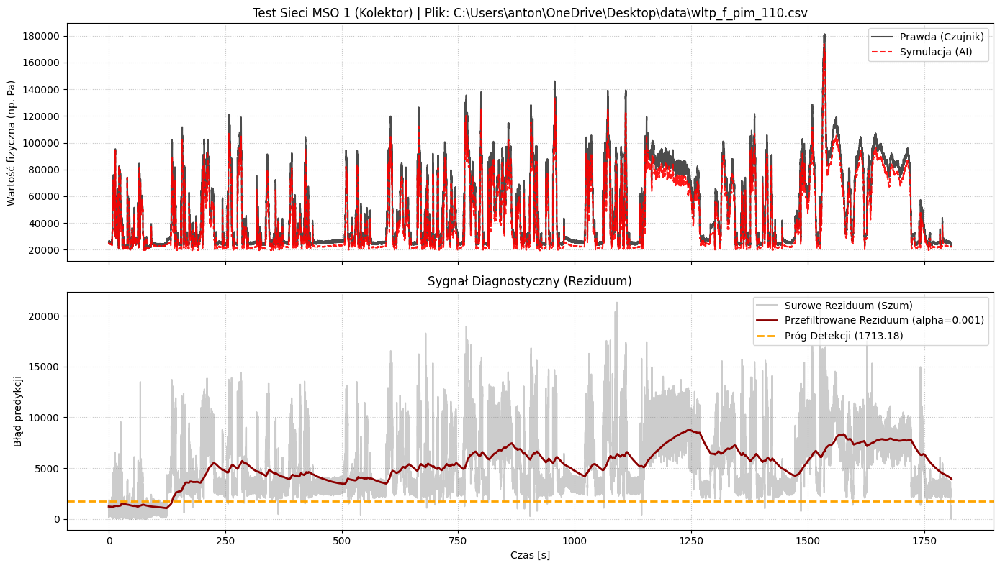

Średni błąd bezwzględny (MAE): 5400.5811
Maksymalny błąd przefiltrowany: 8793.6895


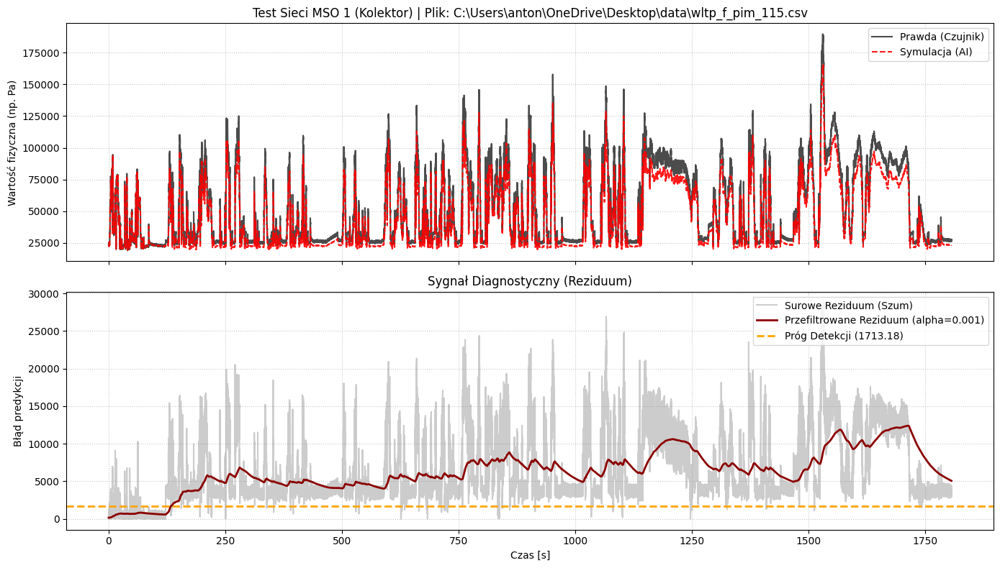

Średni błąd bezwzględny (MAE): 6490.0264
Maksymalny błąd przefiltrowany: 12399.5547


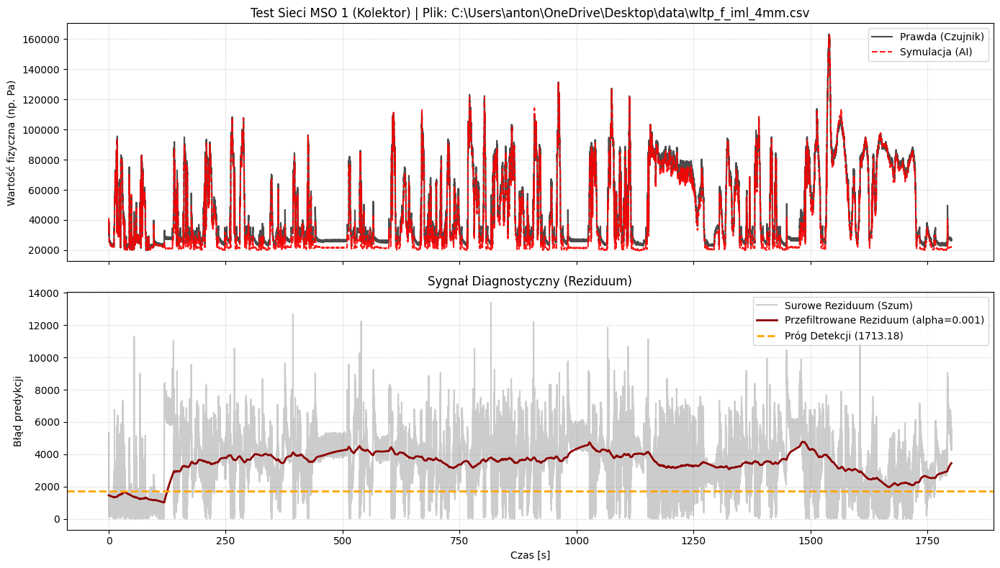

Średni błąd bezwzględny (MAE): 3464.8604
Maksymalny błąd przefiltrowany: 4772.4653


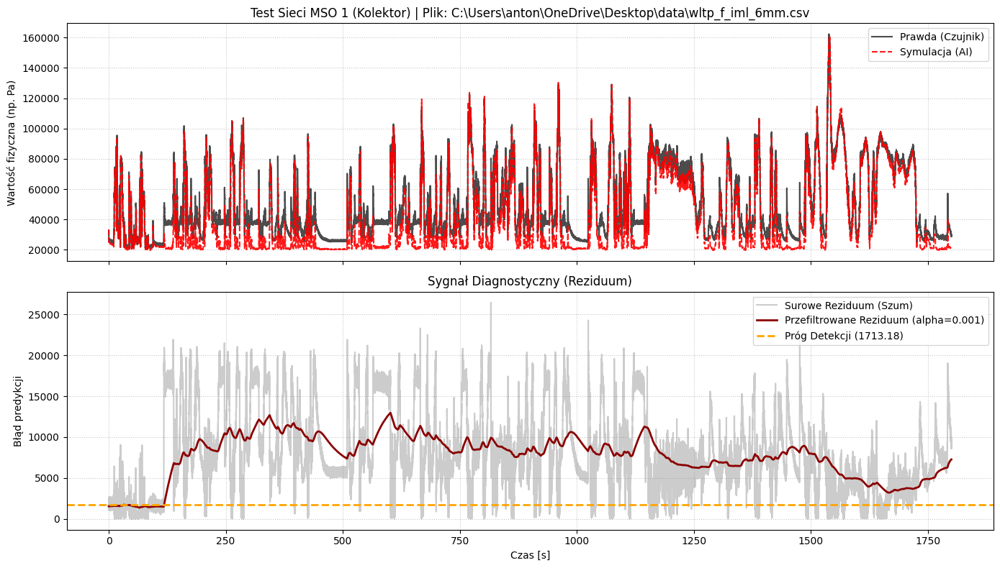

Średni błąd bezwzględny (MAE): 7904.6709
Maksymalny błąd przefiltrowany: 12977.9268


In [10]:
model1 = GreyBoxSystem_MSO1(T_sample=0.05, num_states=5)
# 3. Wczytanie MÓZGU (wytrenowanych wag) i SKALERÓW z dysku
model1.load_state_dict(torch.load('szara_skrzynka_mso1_wagi.pth')) # <-- ZMIEŃ NAZWĘ JEŚLI ZAPISAŁEŚ JAKO _5states!
model1.eval() # Ustawienie modelu w tryb predykcji
scaler_u1 = joblib.load('scaler_u_mso1.pkl')
scaler_y1 = joblib.load('scaler_y_mso1.pkl')

print("Model MSO 1 i skalery zostały pomyślnie wczytane z dysku!")

pliki_testowe = [FAULTY_FILES_PIM, FAULTY_FILES_IML]

for lista in pliki_testowe:
    for plik in lista:
        validate_and_plot(model1, scaler_u1, scaler_y1, u_cols_1, y_cols_1, plik, "Test Sieci MSO 1 (Kolektor)", alpha=0.001, threshold=1713.18)

Pliki na których nie powinno być detekcji

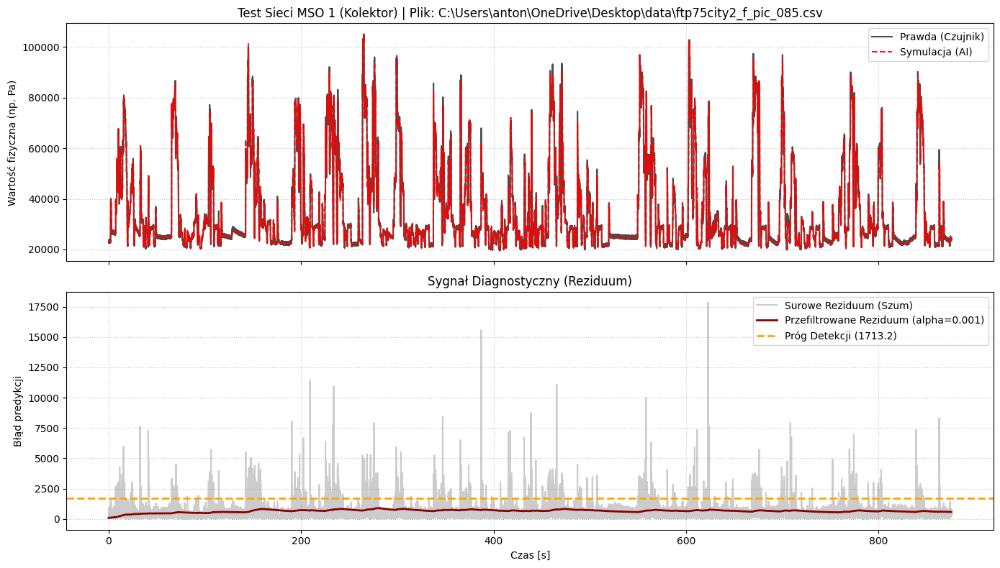

Średni błąd bezwzględny (MAE): 675.5728
Maksymalny błąd przefiltrowany: 886.6826


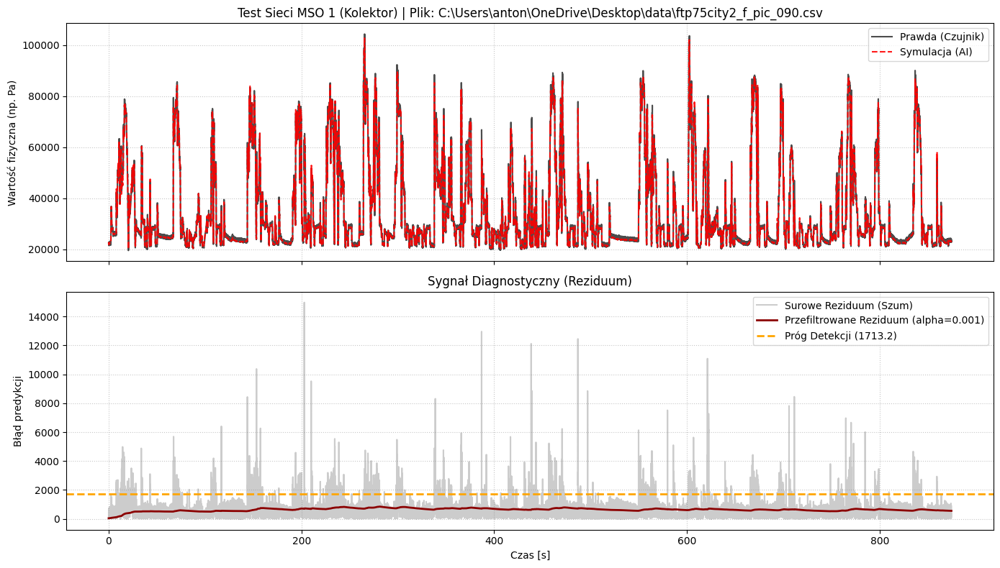

Średni błąd bezwzględny (MAE): 666.7115
Maksymalny błąd przefiltrowany: 851.1027


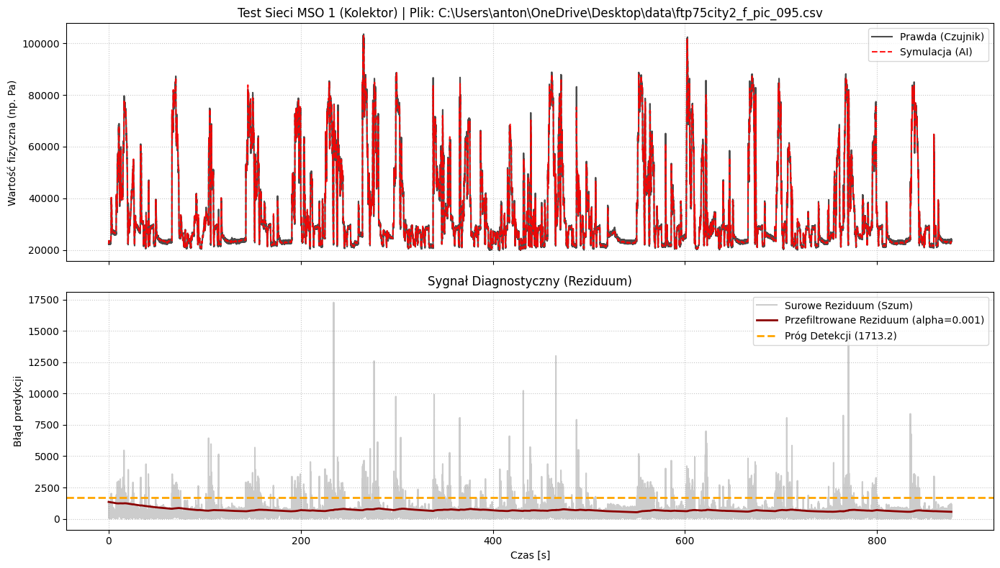

Średni błąd bezwzględny (MAE): 658.1384
Maksymalny błąd przefiltrowany: 1353.3809


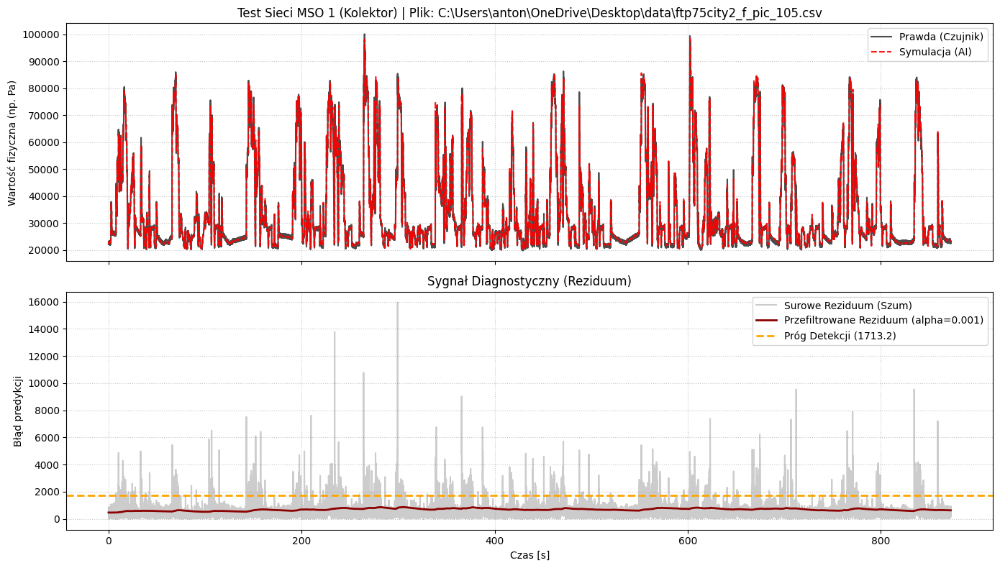

Średni błąd bezwzględny (MAE): 697.3406
Maksymalny błąd przefiltrowany: 868.9290


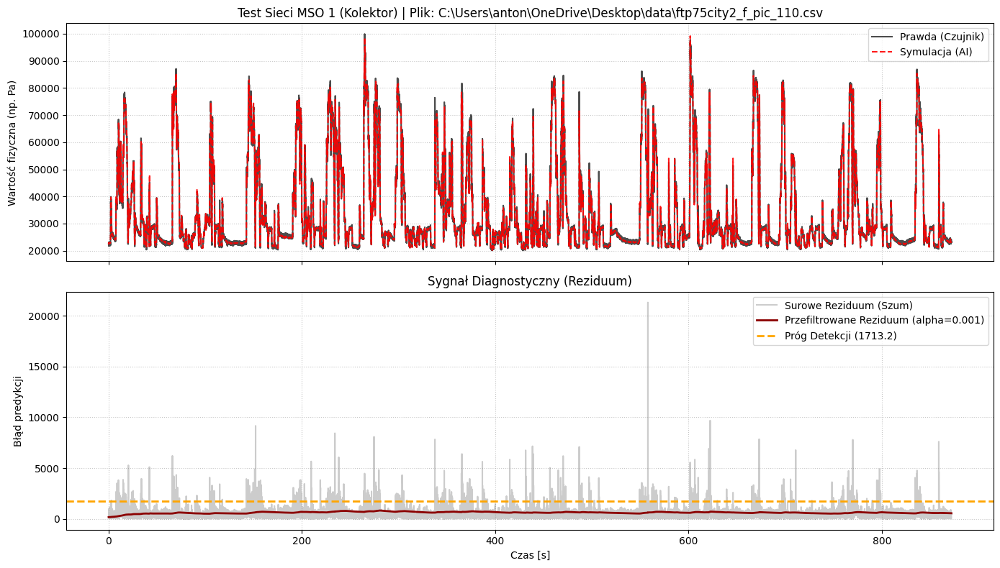

Średni błąd bezwzględny (MAE): 638.9218
Maksymalny błąd przefiltrowany: 824.6691


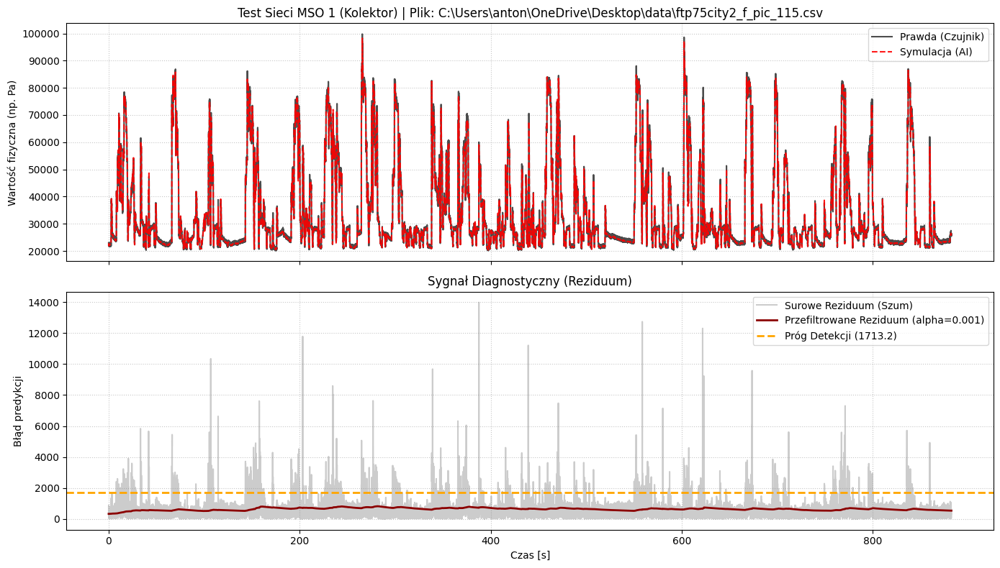

Średni błąd bezwzględny (MAE): 644.8898
Maksymalny błąd przefiltrowany: 819.2618


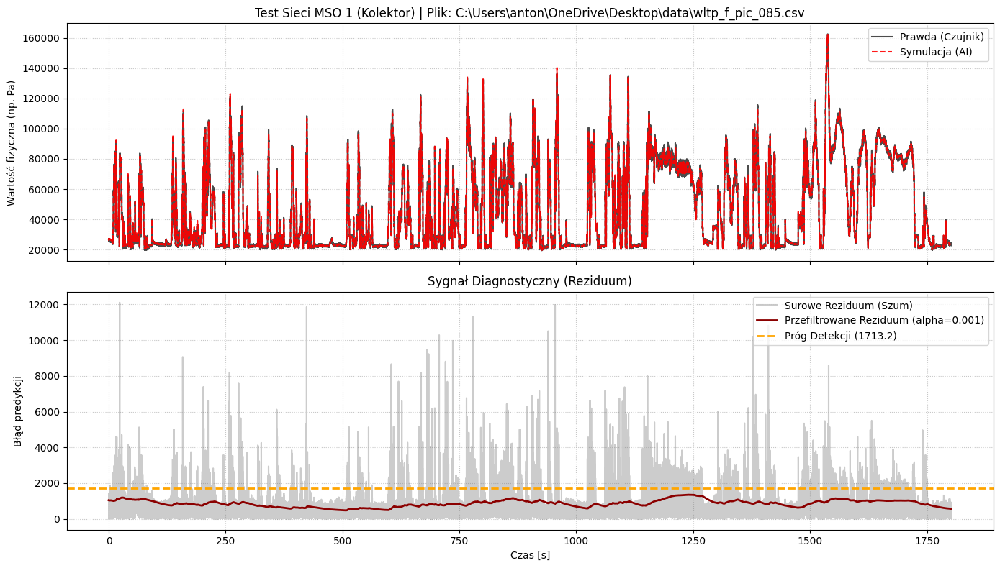

Średni błąd bezwzględny (MAE): 852.3102
Maksymalny błąd przefiltrowany: 1351.8596


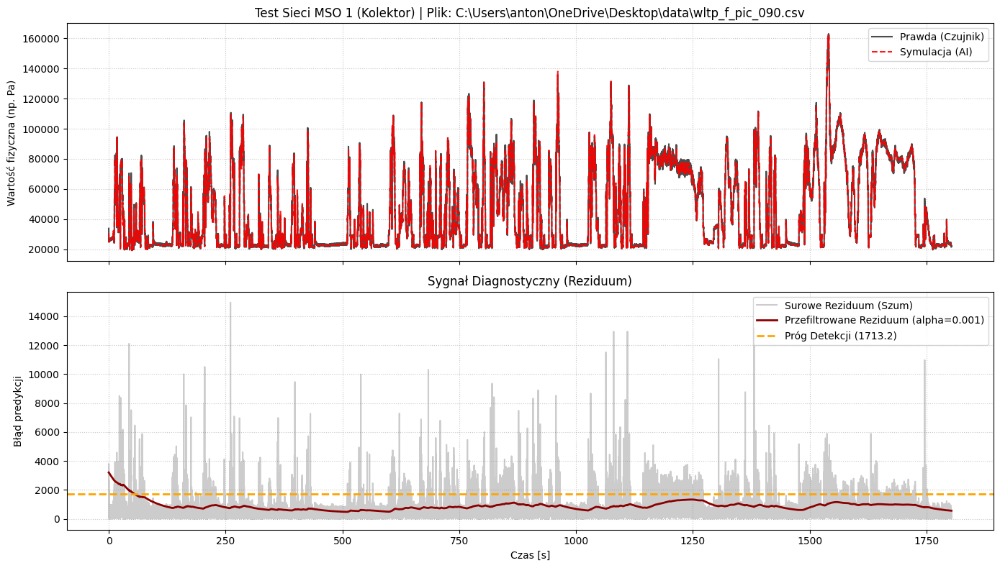

Średni błąd bezwzględny (MAE): 830.3161
Maksymalny błąd przefiltrowany: 3207.4141


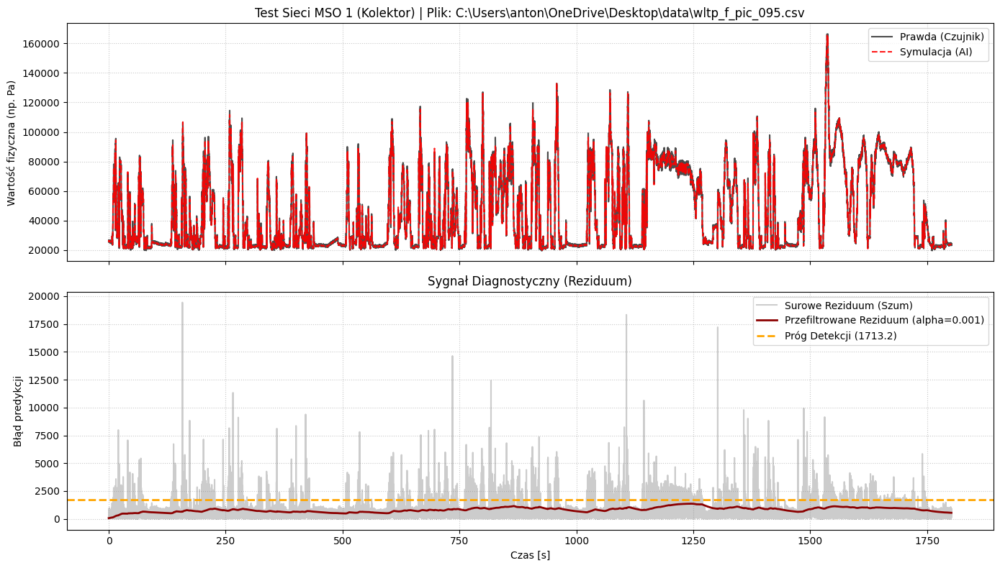

Średni błąd bezwzględny (MAE): 833.9919
Maksymalny błąd przefiltrowany: 1367.8162


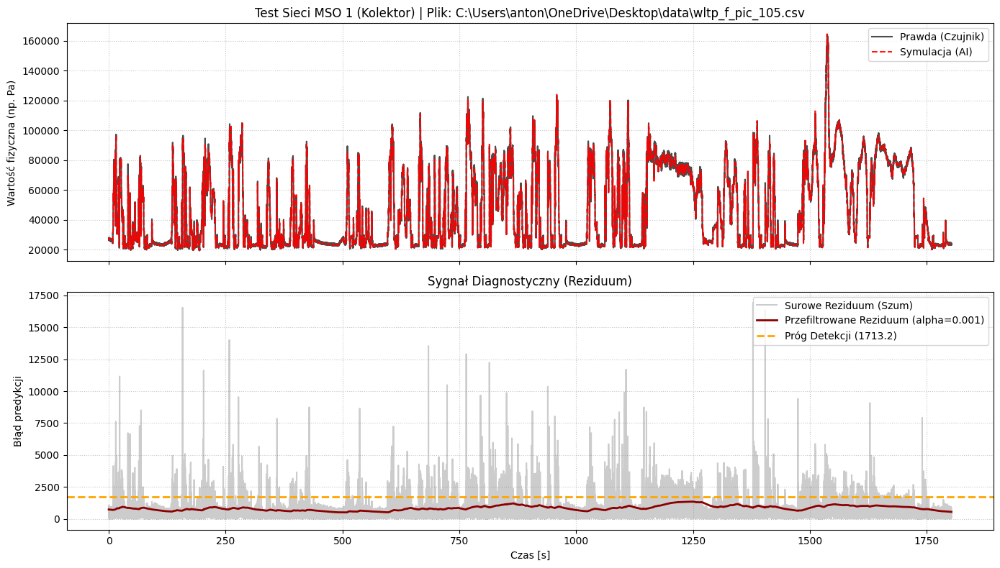

Średni błąd bezwzględny (MAE): 841.9142
Maksymalny błąd przefiltrowany: 1351.9939


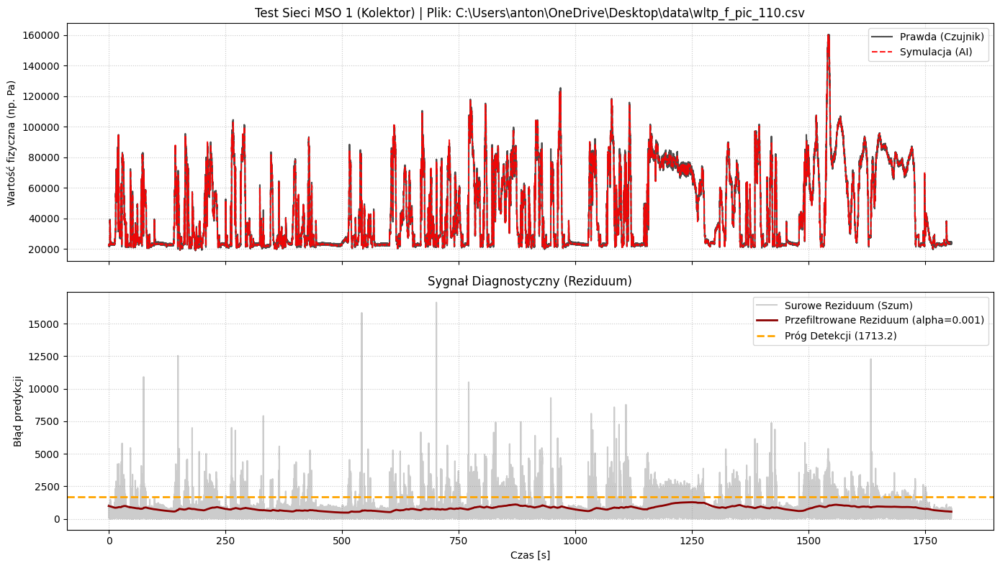

Średni błąd bezwzględny (MAE): 803.9033
Maksymalny błąd przefiltrowany: 1282.2692


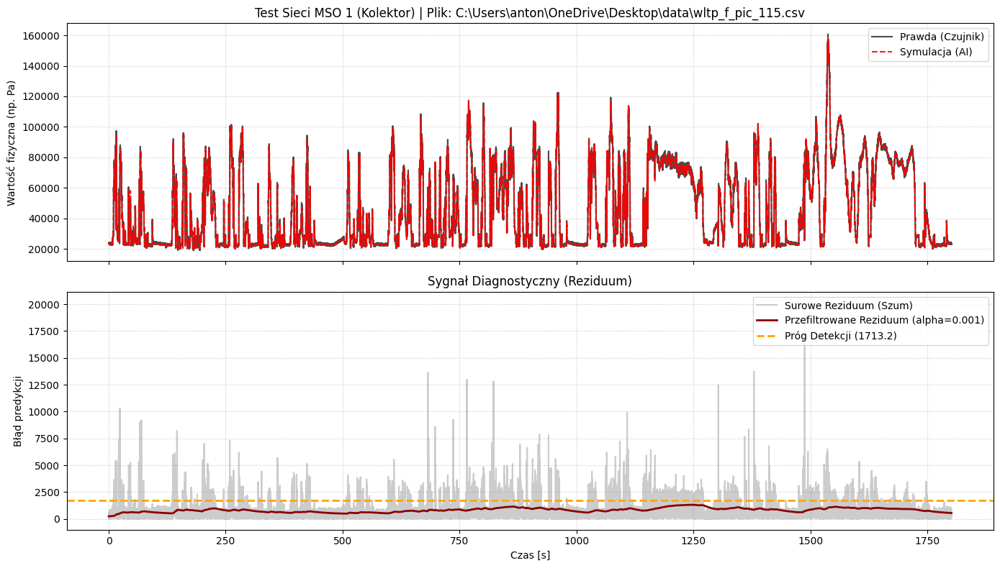

Średni błąd bezwzględny (MAE): 826.7921
Maksymalny błąd przefiltrowany: 1314.2411


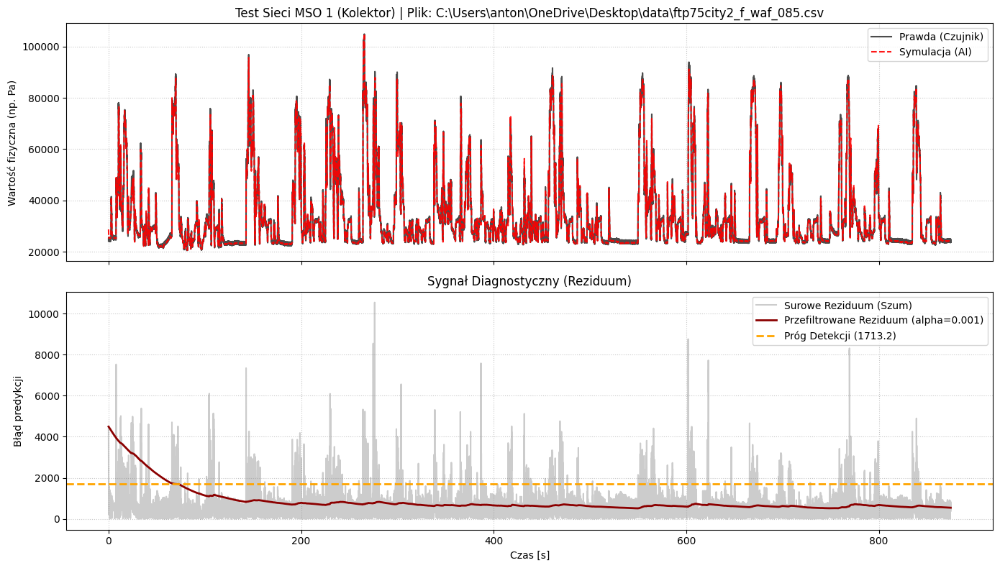

Średni błąd bezwzględny (MAE): 651.7617
Maksymalny błąd przefiltrowany: 4493.9141


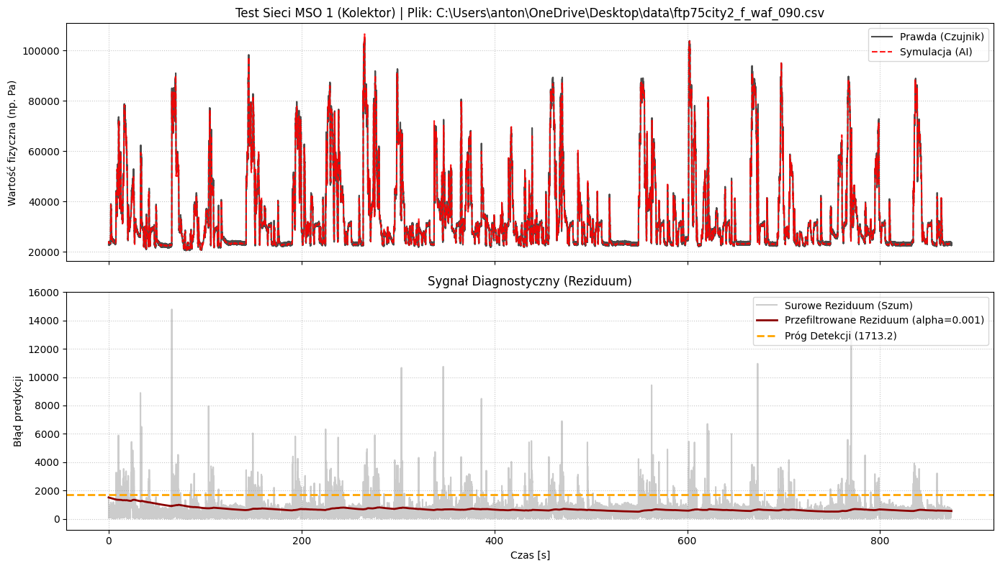

Średni błąd bezwzględny (MAE): 640.3770
Maksymalny błąd przefiltrowany: 1512.8086


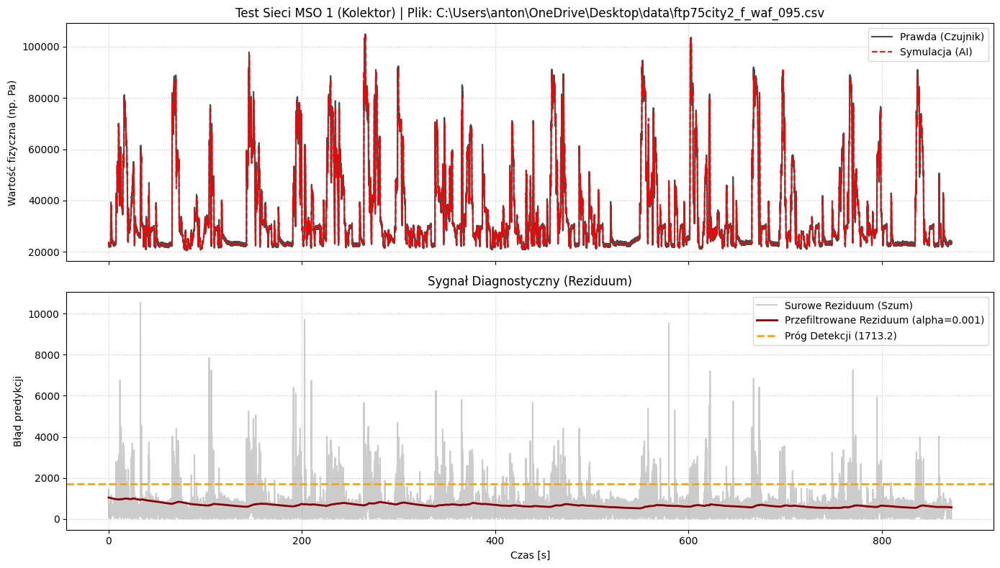

Średni błąd bezwzględny (MAE): 640.8080
Maksymalny błąd przefiltrowany: 1038.9431


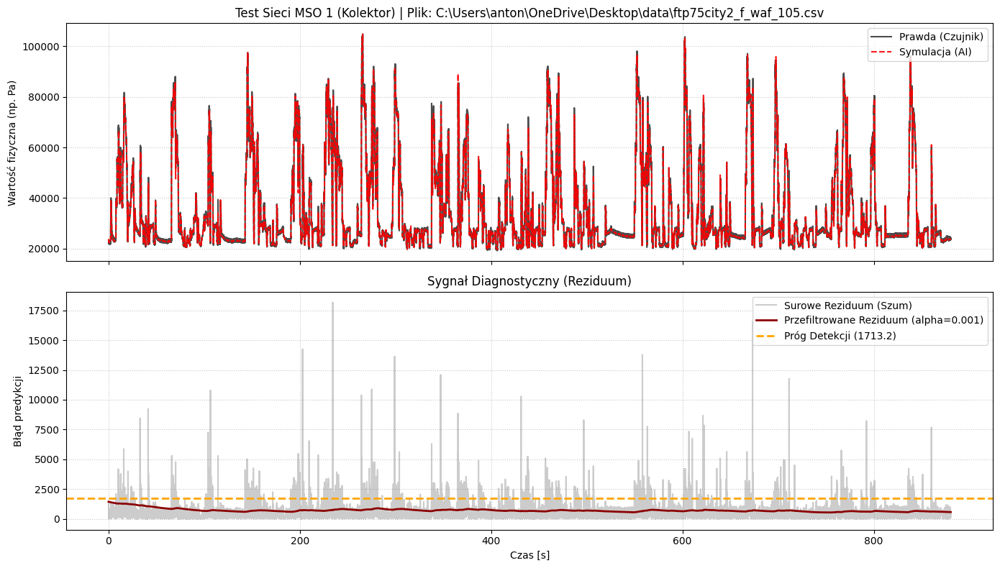

Średni błąd bezwzględny (MAE): 670.0333
Maksymalny błąd przefiltrowany: 1436.0176


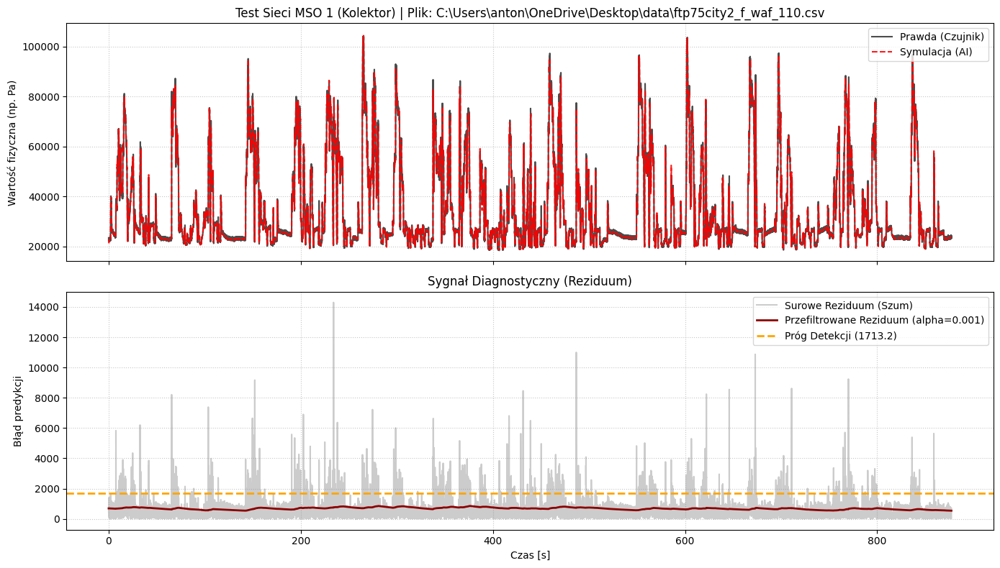

Średni błąd bezwzględny (MAE): 674.4381
Maksymalny błąd przefiltrowany: 854.5965


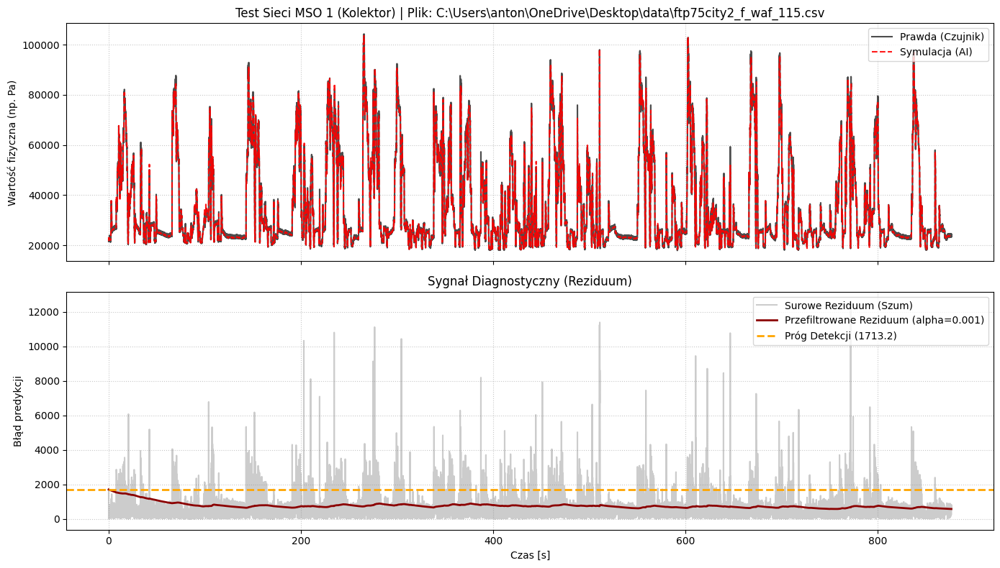

Średni błąd bezwzględny (MAE): 704.8198
Maksymalny błąd przefiltrowany: 1704.4766


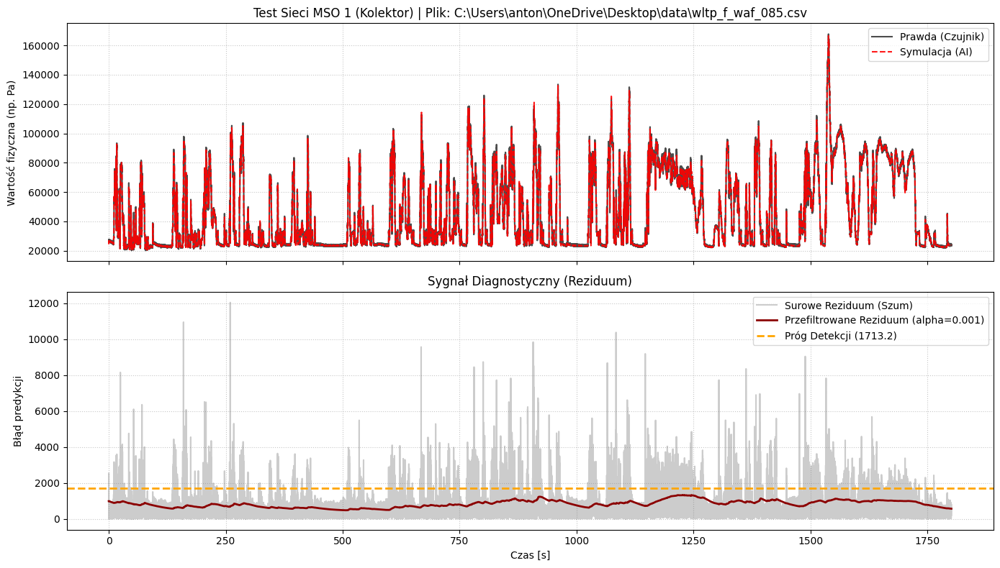

Średni błąd bezwzględny (MAE): 822.5394
Maksymalny błąd przefiltrowany: 1319.4674


KeyboardInterrupt: 

In [11]:
pliki_testowe = [FAULTY_FILES_PIC, FAULTY_FILES_WAF]

for lista in pliki_testowe:
    for plik in lista:
        validate_and_plot(model1, scaler_u1, scaler_y1, u_cols_1, y_cols_1, plik, "Test Sieci MSO 1 (Kolektor)", alpha=0.001, threshold=1713.2)

In [6]:
pliki_do_walidacji = FAULTY_FILES_PIM + FAULTY_FILES_PIC + FAULTY_FILES_IML + FAULTY_FILES_WAF + HEALTHY_FILES

model1 = GreyBoxSystem_MSO1(T_sample=0.05, num_states=5)
# 3. Wczytanie MÓZGU (wytrenowanych wag) i SKALERÓW z dysku
model1.load_state_dict(torch.load('szara_skrzynka_mso1_wagi.pth')) # <-- ZMIEŃ NAZWĘ JEŚLI ZAPISAŁEŚ JAKO _5states!
model1.eval() # Ustawienie modelu w tryb predykcji
scaler_u1 = joblib.load('scaler_u_mso1.pkl')
scaler_y1 = joblib.load('scaler_y_mso1.pkl')

czestotliwosc_Hz = 20
czas_zdrowy_s = 110
limit_probek = czas_zdrowy_s * czestotliwosc_Hz
burn_in = 0

alpha = 0.0008 

wszystkie_rezidua_przefiltrowane = []
wszystkie_rezidua_surowe_bias = []

print("Rozpoczynam analizę statystyczną na przefiltrowanych zdrowych fragmentach...")
model1.eval()

with torch.no_grad():
    for plik in pliki_do_walidacji:
        df = pd.read_csv(plik)
        df_zdrowe = df.iloc[:limit_probek]
        
        X_tensor = torch.tensor(scaler_u1.transform(df_zdrowe[u_cols_1].values), dtype=torch.float32).unsqueeze(0)
        Y_tensor = torch.tensor(scaler_y1.transform(df_zdrowe[y_cols_1].values), dtype=torch.float32).unsqueeze(0)
        
        x_init = torch.zeros(1, model1.num_states)
        y_pred = model1(X_tensor, x_init)
        
        y_pred_real = scaler_y1.inverse_transform(y_pred[0].cpu().numpy().reshape(-1, 1))
        y_true_real = scaler_y1.inverse_transform(Y_tensor[0].cpu().numpy().reshape(-1, 1))
        
        # 1. Surowy błąd bezwzględny
        e_raw_abs = np.abs(y_true_real - y_pred_real).flatten()
        
        # 2. Surowy błąd ze znakiem (do sprawdzania Biasu)
        e_raw_znak = (y_true_real - y_pred_real).flatten()
        
        # 3. FILTRACJA EMA (To, czego brakowało!)
        e_filtered = np.zeros_like(e_raw_abs)
        e_filtered[0] = e_raw_abs[0]
        for i in range(1, len(e_raw_abs)):
            e_filtered[i] = alpha * e_raw_abs[i] + (1 - alpha) * e_filtered[i-1]
        
        # Zapisujemy do głównej listy (omijając strefę Burn-in)
        wszystkie_rezidua_przefiltrowane.extend(e_filtered[burn_in:])
        wszystkie_rezidua_surowe_bias.extend(e_raw_znak[burn_in:])

# Konwersja na szybkie tablice NumPy
wszystkie_rezidua_przefiltrowane = np.array(wszystkie_rezidua_przefiltrowane)
wszystkie_rezidua_surowe_bias = np.array(wszystkie_rezidua_surowe_bias)

# OBLICZANIE STATYSTYK NA SYGNALE PRZEFILTROWANYM
srednia_filt = np.mean(wszystkie_rezidua_przefiltrowane)
std_filt = np.std(wszystkie_rezidua_przefiltrowane)
bias_modelu = np.mean(wszystkie_rezidua_surowe_bias)

print(f"\n{'='*50}")
print(f"WYNIKI WALIDACJI STATYSTYCZNEJ (MSO 0) - Z FILTREM (alpha={alpha})")
print(f"{'='*50}")
print(f"Średni uchyb (wygładzony)     : {srednia_filt:.2f} Pa")
print(f"Odchylenie standardowe (sigma): {std_filt:.2f} Pa")
print(f"Błąd systematyczny (Bias)     : {bias_modelu:.2f} Pa")
print(f"-"*50)

# Reguła 3 sigm (99.7% pewności) do wyznaczania progów:
prog_3sigma = srednia_filt + (3 * std_filt)
prog_6sigma = srednia_filt + (6 * std_filt)

print(f"💡 WNIOSKI DLA PROGÓW (Thresholds) DLA SYGNAŁU PRZEFILTROWANEGO:")
print(f"-> Bezpieczny próg (3 sigma) to {prog_3sigma:.2f} Pa.")
print(f"-> Bardzo ostrożny próg (6 sigma) to {prog_6sigma:.2f} Pa.")

Rozpoczynam analizę statystyczną na przefiltrowanych zdrowych fragmentach...

WYNIKI WALIDACJI STATYSTYCZNEJ (MSO 0) - Z FILTREM (alpha=0.0008)
Średni uchyb (wygładzony)     : 1044.33 Pa
Odchylenie standardowe (sigma): 682.97 Pa
Błąd systematyczny (Bias)     : 224.40 Pa
--------------------------------------------------
💡 WNIOSKI DLA PROGÓW (Thresholds) DLA SYGNAŁU PRZEFILTROWANEGO:
-> Bezpieczny próg (3 sigma) to 3093.25 Pa.
-> Bardzo ostrożny próg (6 sigma) to 5142.17 Pa.
